In [ ]:
optimizer.param_groups[0]['lr'] = 0.1

In [ ]:
"""for epoch in tqdm(range(max_epoch)):
    if break_flag == True:
        break
    idx_video = 0
    if skip_0epoch and epoch == 0:
        continue
    for to_train in [True, False]:
        tqdm_dataset = tqdm(dataset_train if to_train else dataset_test)
        for frame in tqdm_dataset:
            idx_video += 1
            if not optimize_image:
                X = frame.to(device).requires_grad_()
                X.retain_grad()
                Y = X.clone().detach().to(device).requires_grad_()
                Y.retain_grad()
            optimizer.zero_grad()
            X_enhance = net_enhance(X)
            X_out = net_codec.forward(X_enhance)
            loss = loss_calc(X_out, Y)
            if epoch != 0 and to_train:
                loss["loss"].backward()
                optimizer.step()
    print(loss)"""

In [ ]:
from Current_model_lib import *
net_enhance = nn.Sequential(nn.Conv2d(3, 3, 3,1, "same"),)
net_enhance = net_enhance.to("cuda:0")

In [ ]:
for i in net_codec.parameters():
    i.retain_grad()

In [ ]:
net_codec = net_codec.eval()

In [ ]:

net_enhance = nn.Sequential(nn.Conv2d(3, 3, 3,1, "same"),).to(device)

net_enhance = net_enhance.requires_grad_(True)
for i in net_enhance.parameters():
    i.retain_grad()

In [ ]:
parameters = list(net_enhance.parameters())
optimizer = optim.Adam(parameters, lr=1e-3)

In [ ]:
for i in range(30):
    optimizer.zero_grad()
    X_enhance = net_enhance(X)
    """X_enhance.data.clamp_(min=0,max=1)"""
    """X_out['x_hat'].data.clamp_(min=0,max=1)"""

    #X_out['x_hat'] = torch.nan_to_num(X_out['x_hat'])
    #Y = torch.nan_to_num(Y)
    X_out = net_codec.forward(X_enhance)
    loss = loss_calc(X_out, Y)
    loss["loss"].backward()
    optimizer.step()

    if i % 3 == 0:
        #print(torch.sum(torch.abs(torch.tensor([i.grad for i in net_enhance.parameters()]))).item())
        print(loss['loss'].item())

<string>:217: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
<string>:217: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
<string>:217: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique lab

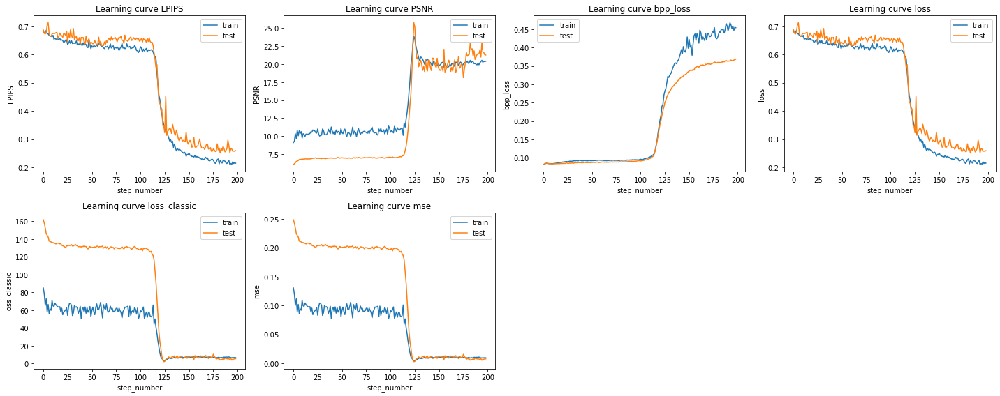

<Figure size 432x288 with 0 Axes>

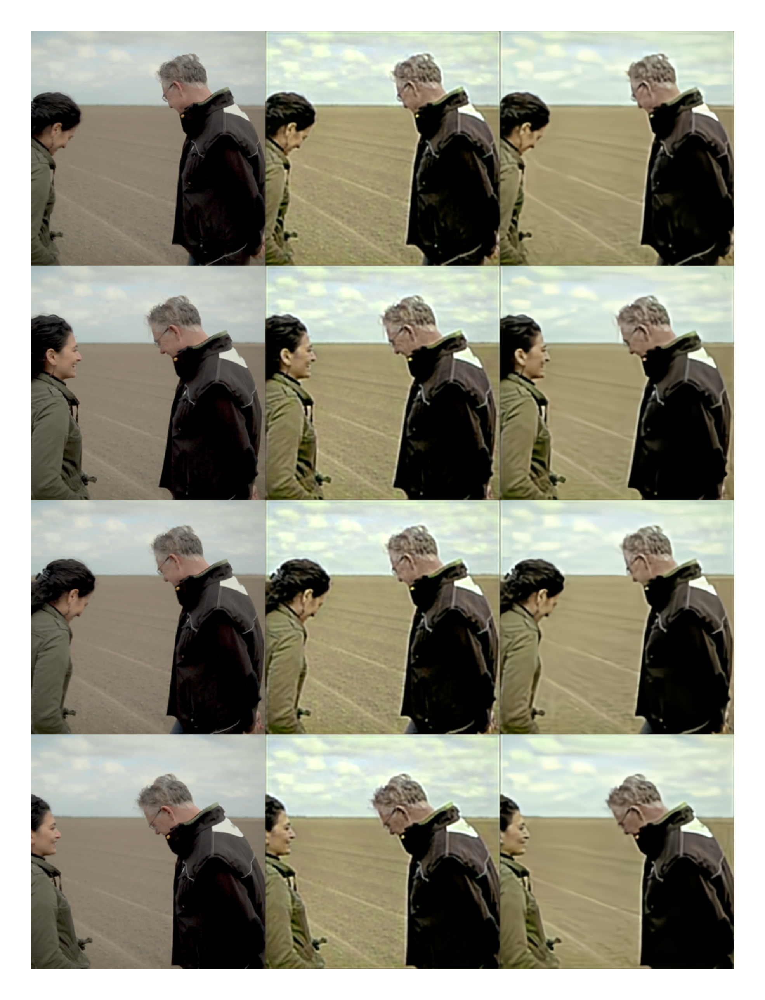

In [1]:
%run launch_tuning_fr -met LPIPS -optimizeimg 0 -quality 3 -datalentrain 40 -datalentest 32 -epochs 200
#Tracking models#SGD

<string>:219: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
<string>:219: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
<string>:219: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique lab

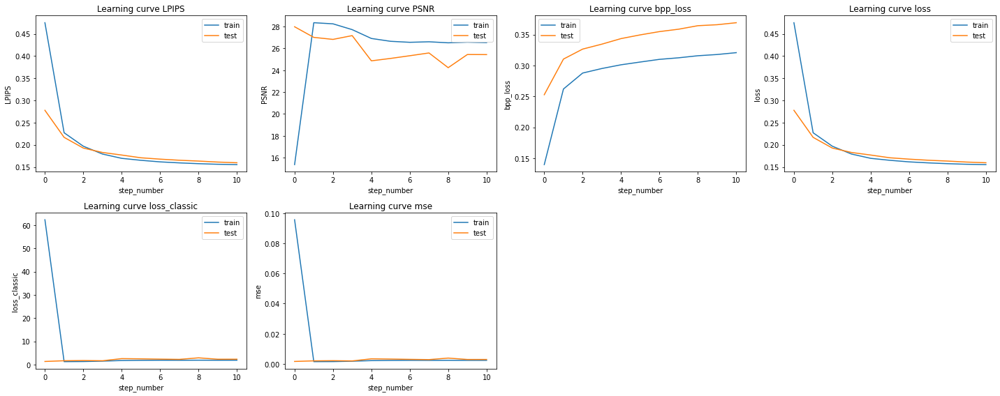

<Figure size 432x288 with 0 Axes>

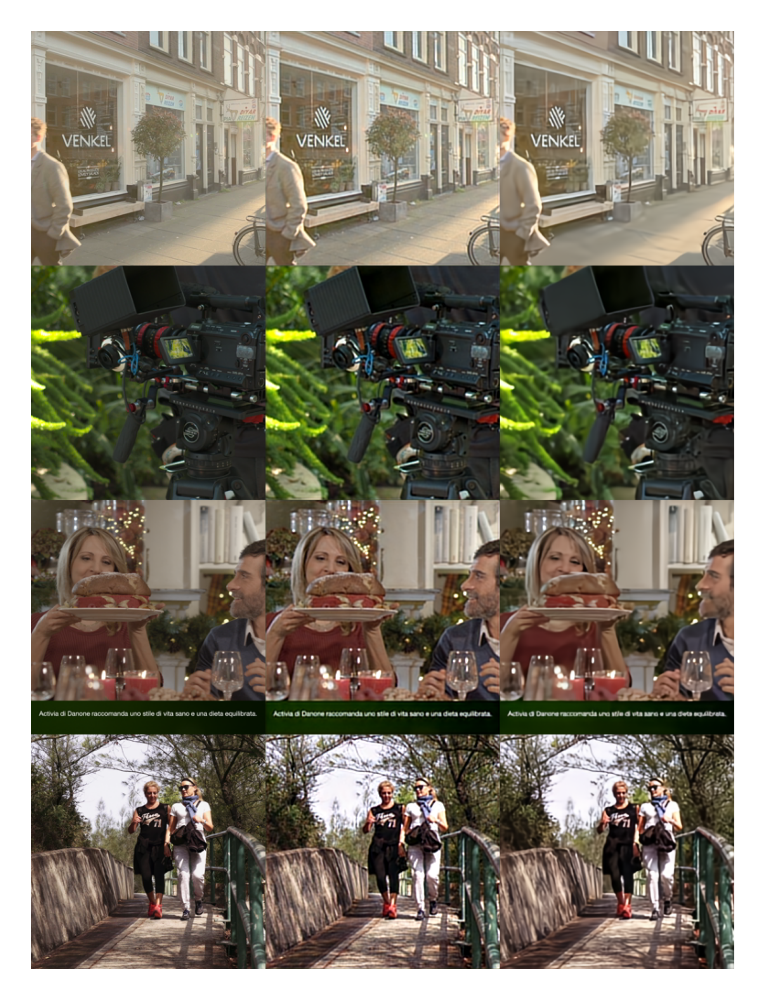

In [1]:
%run launch_tuning_fr -met LPIPS -optimizeimg 0 -quality 3

In [1]:
v = []
for met in ["HaarPSI", "DSS", "VIFLoss", "GMSD", "MDSI", "VSI", "LPIPS", "SRSIM", "DISTS", "SSIM", "DISTS1", "LPIPS1"]:
    #try:
    %run launch_tuning_fr -met mse -optimizeimg 0 -quality 3
    loss_calc = Custom_enh_Loss(target_lst = [met], k_lst=[1.]).to(device)
    with torch.no_grad():
        base_vals = calculate_met(loss_calc, max_epoch)
    #except Exception:
    #print("Exception")
    v.append(base_vals)

mse


Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: havent_invented (use `wandb login --relogin` to force relogin)


  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/2750 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

mse


HaarPSI,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
HaarPSI_test,▁▁▁▁▁▁▁▁▁▁▁▁
PSNR,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
PSNR_test,▁▁▁▁▁▁▁▁▁▁▁▁
bpp_loss,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
bpp_loss_test,▁▁▁▁▁▁▁▁▁▁▁▁
loss,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
loss_classic,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
loss_classic_test,▁▁▁▁▁▁▁▁▁▁▁▁
loss_test,▁▁▁▁▁▁▁▁▁▁▁▁
mse,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/2750 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

mse


DSS,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
DSS_test,▁▁▁▁▁▁▁▁▁▁▁▁
PSNR,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
PSNR_test,▁▁▁▁▁▁▁▁▁▁▁▁
bpp_loss,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
bpp_loss_test,▁▁▁▁▁▁▁▁▁▁▁▁
loss,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
loss_classic,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
loss_classic_test,▁▁▁▁▁▁▁▁▁▁▁▁
loss_test,▁▁▁▁▁▁▁▁▁▁▁▁
mse,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/2750 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

mse


PSNR,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
PSNR_test,▁▁▁▁▁▁▁▁▁▁▁▁
VIFLoss,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
VIFLoss_test,▁▁▁▁▁▁▁▁▁▁▁▁
bpp_loss,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
bpp_loss_test,▁▁▁▁▁▁▁▁▁▁▁▁
loss,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
loss_classic,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
loss_classic_test,▁▁▁▁▁▁▁▁▁▁▁▁
loss_test,▁▁▁▁▁▁▁▁▁▁▁▁
mse,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/2750 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

mse


GMSD,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
GMSD_test,▁▁▁▁▁▁▁▁▁▁▁▁
PSNR,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
PSNR_test,▁▁▁▁▁▁▁▁▁▁▁▁
bpp_loss,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
bpp_loss_test,▁▁▁▁▁▁▁▁▁▁▁▁
loss,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
loss_classic,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
loss_classic_test,▁▁▁▁▁▁▁▁▁▁▁▁
loss_test,▁▁▁▁▁▁▁▁▁▁▁▁
mse,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/2750 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

mse


MDSI,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
MDSI_test,▁▁▁▁▁▁▁▁▁▁▁▁
PSNR,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
PSNR_test,▁▁▁▁▁▁▁▁▁▁▁▁
bpp_loss,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
bpp_loss_test,▁▁▁▁▁▁▁▁▁▁▁▁
loss,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
loss_classic,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
loss_classic_test,▁▁▁▁▁▁▁▁▁▁▁▁
loss_test,▁▁▁▁▁▁▁▁▁▁▁▁
mse,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/2750 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

mse


PSNR,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
PSNR_test,▁▁▁▁▁▁▁▁▁▁▁▁
VSI,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
VSI_test,▁▁▁▁▁▁▁▁▁▁▁▁
bpp_loss,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
bpp_loss_test,▁▁▁▁▁▁▁▁▁▁▁▁
loss,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
loss_classic,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
loss_classic_test,▁▁▁▁▁▁▁▁▁▁▁▁
loss_test,▁▁▁▁▁▁▁▁▁▁▁▁
mse,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/2750 [00:00<?, ?it/s]

C:\ProgramData\Anaconda3\envs\backup\lib\site-packages\torch\nn\functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  ..\c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


  0%|          | 0/100 [00:00<?, ?it/s]

mse


LPIPS,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
LPIPS_test,▁▁▁▁▁▁▁▁▁▁▁▁
PSNR,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
PSNR_test,▁▁▁▁▁▁▁▁▁▁▁▁
bpp_loss,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
bpp_loss_test,▁▁▁▁▁▁▁▁▁▁▁▁
loss,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
loss_classic,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
loss_classic_test,▁▁▁▁▁▁▁▁▁▁▁▁
loss_test,▁▁▁▁▁▁▁▁▁▁▁▁
mse,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/2750 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

mse


PSNR,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
PSNR_test,▁▁▁▁▁▁▁▁▁▁▁▁
SRSIM,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
SRSIM_test,▁▁▁▁▁▁▁▁▁▁▁▁
bpp_loss,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
bpp_loss_test,▁▁▁▁▁▁▁▁▁▁▁▁
loss,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
loss_classic,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
loss_classic_test,▁▁▁▁▁▁▁▁▁▁▁▁
loss_test,▁▁▁▁▁▁▁▁▁▁▁▁
mse,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/2750 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

mse


DISTS,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
DISTS_test,▁▁▁▁▁▁▁▁▁▁▁▁
PSNR,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
PSNR_test,▁▁▁▁▁▁▁▁▁▁▁▁
bpp_loss,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
bpp_loss_test,▁▁▁▁▁▁▁▁▁▁▁▁
loss,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
loss_classic,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
loss_classic_test,▁▁▁▁▁▁▁▁▁▁▁▁
loss_test,▁▁▁▁▁▁▁▁▁▁▁▁
mse,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/2750 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

In [12]:
loss = loss_calc({"x_hat": next(iter(dataset_train))}, next(iter(dataset_train)))
loss

{'mse': tensor(0.1240),
 'PSNR': tensor(9.0670),
 'HaarPSI': tensor(0.8018),
 'loss': tensor(0.8018)}

In [19]:
logs_plot1

{'mse': [0.1239663,
  0.1239663,
  0.1239663,
  0.1239663,
  0.1239663,
  0.1239663,
  0.1239663,
  0.1239663,
  0.1239663,
  0.1239663,
  0.1239663],
 'PSNR': [9.066964,
  9.066964,
  9.066964,
  9.066964,
  9.066964,
  9.066964,
  9.066964,
  9.066964,
  9.066964,
  9.066964,
  9.066964],
 'HaarPSI': [0.80175525,
  0.80175525,
  0.80175525,
  0.80175525,
  0.80175525,
  0.80175525,
  0.80175525,
  0.80175525,
  0.80175525,
  0.80175525,
  0.80175525],
 'loss': [0.80175525,
  0.80175525,
  0.80175525,
  0.80175525,
  0.80175525,
  0.80175525,
  0.80175525,
  0.80175525,
  0.80175525,
  0.80175525,
  0.80175525]}

In [ ]:
ffmpeg -i input.mov -c:v mjpeg -an output.mov

In [38]:
logs_plot

{'mse': [0.036012825,
  0.0037232584,
  0.0021479155,
  0.0017794181,
  0.0016378233,
  0.0015243499,
  0.0014595814,
  0.0013446135,
  0.0012675984,
  0.0011882057,
  0.0011140539,
  0.0011140539],
 'bpp_loss': [0.17623052,
  0.23136972,
  0.25018665,
  0.2581809,
  0.26387262,
  0.26691496,
  0.27037537,
  0.27173197,
  0.2739343,
  0.27467194,
  0.27706966,
  0.27706966],
 'loss_classic': [23.593569,
  2.6524184,
  1.6468686,
  1.4152476,
  1.3288672,
  1.2581235,
  1.2194681,
  1.1460669,
  1.0981901,
  1.0473026,
  1.0014832,
  1.0014832],
 'PSNR': [18.108215,
  24.717712,
  26.99856,
  27.783194,
  28.119783,
  28.39596,
  28.560602,
  28.888466,
  29.126986,
  29.394625,
  29.664183,
  29.664183],
 'DISTS': [0.3171136,
  0.18839751,
  0.15956222,
  0.14736152,
  0.13909377,
  0.13337962,
  0.12953278,
  0.12658815,
  0.12421407,
  0.12206159,
  0.11963963,
  0.11963963],
 'loss': [0.3171136,
  0.18839751,
  0.15956222,
  0.14736152,
  0.13909377,
  0.13337962,
  0.12953278,
  0.

In [4]:
["model_vimeo11k_DISTS_cheng2020_attn_quality2_FRtuning.ckpt",
"model_vimeo11k_SRSIM_cheng2020_attn_quality2_FRtuning.ckpt",
"model_vimeo11k_HaarPSI_cheng2020_attn_quality2_FRtuning.ckpt",
"model_vimeo11k_DSS_cheng2020_attn_quality2_FRtuning.ckpt",
"model_vimeo11k_VIFLoss_cheng2020_attn_quality2_FRtuning.ckpt",
"model_vimeo11k_GMSD_cheng2020_attn_quality2_FRtuning.ckpt",
"model_vimeo11k_MDSI_cheng2020_attn_quality2_FRtuning.ckpt",
"model_vimeo11k_VSI_cheng2020_attn_quality2_FRtuning.ckpt",
"model_vimeo11k_LPIPS_cheng2020_attn_quality2_FRtuning.ckpt",
"model_vimeo11k_LPIPS1_no_codec_FRtuning.ckpt",
"model_vimeo11k_LPIPS1_cheng2020_attn_quality2_FRtuning.ckpt",
"model_vimeo11k_LPIPS1_cheng2020_attn_quality2_FRtuning_COPY.ckpt",
"model_vimeo11k_DISTS1_cheng2020_attn_quality2_FRtuning-copy.ckpt",
"model_vimeo11k_DISTS1_cheng2020_attn_quality2_FRtuning.ckpt",
"model_vimeo11k_LPIPS1_cheng2020_attn_quality2_FRtuning_сщзн.ckpt",
"model_vimeo11k_LPIPS_cheng2020_attn_quality2_FRtuning - Copy.ckpt",]


['model_vimeo11k_DISTS_cheng2020_attn_quality2_FRtuning.ckpt',
 'model_vimeo11k_SRSIM_cheng2020_attn_quality2_FRtuning.ckpt',
 'model_vimeo11k_HaarPSI_cheng2020_attn_quality2_FRtuning.ckpt',
 'model_vimeo11k_DSS_cheng2020_attn_quality2_FRtuning.ckpt',
 'model_vimeo11k_VIFLoss_cheng2020_attn_quality2_FRtuning.ckpt',
 'model_vimeo11k_GMSD_cheng2020_attn_quality2_FRtuning.ckpt',
 'model_vimeo11k_MDSI_cheng2020_attn_quality2_FRtuning.ckpt',
 'model_vimeo11k_VSI_cheng2020_attn_quality2_FRtuning.ckpt',
 'model_vimeo11k_LPIPS_cheng2020_attn_quality2_FRtuning.ckpt',
 'model_vimeo11k_LPIPS1_no_codec_FRtuning.ckpt',
 'model_vimeo11k_LPIPS1_cheng2020_attn_quality2_FRtuning.ckpt',
 'model_vimeo11k_LPIPS1_cheng2020_attn_quality2_FRtuning_COPY.ckpt',
 'model_vimeo11k_DISTS1_cheng2020_attn_quality2_FRtuning-copy.ckpt',
 'model_vimeo11k_DISTS1_cheng2020_attn_quality2_FRtuning.ckpt',
 'model_vimeo11k_LPIPS1_cheng2020_attn_quality2_FRtuning_сщзн.ckpt',
 'model_vimeo11k_LPIPS_cheng2020_attn_quality2_FRtu

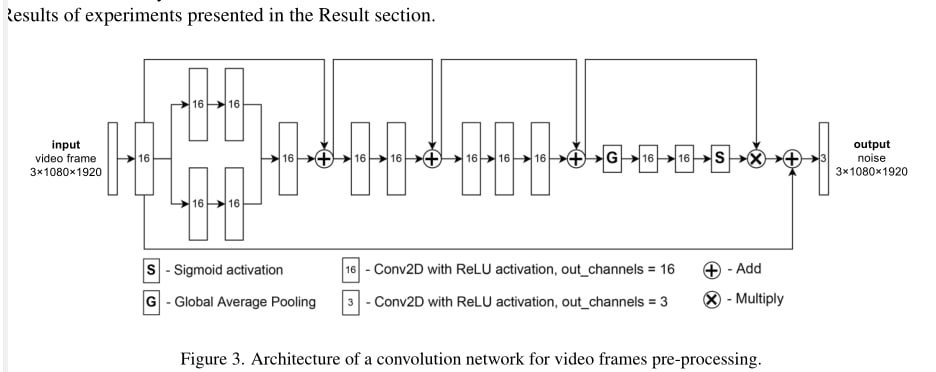